## Import libraries

In [1]:
import numpy as np
import statistics
import pyedflib
# import mne

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt

from IPython.display import display, Markdown  #display(Markdown("# Hello World!"))


### Read dataset

In [2]:
display(Markdown('[All signals were sampled at 256 samples per second with 16-bit resolution]\
(https://www.researchgate.net/figure/23-scalp-EEG-channels-in-the-CHB-MIT-recordings_tbl1_356885415)'))

# File Name: chb07_13.edf
# File Start Time: 11:46:29
# File End Time: 12:48:35
# Number of Seizures in File: 1
# Seizure 1 Start Time: 3285 seconds
# Seizure 1 End Time: 3381 seconds

sample_rate = 256

[All signals were sampled at 256 samples per second with 16-bit resolution](https://www.researchgate.net/figure/23-scalp-EEG-channels-in-the-CHB-MIT-recordings_tbl1_356885415)

In [3]:
def readedf(path):
    f = pyedflib.EdfReader(path)
    n = f.signals_in_file
    signal_labels = f.getSignalLabels()
    sigbufs = np.zeros((n, f.getNSamples()[0]))
    for i in np.arange(n):
        sigbufs[i,:] = f.readSignal(i)
    return sigbufs

In [4]:
# f = pyedflib.EdfReader('./chb07_12.seizures.edf')
# n = f.signals_in_file

# signal_labels = f.getSignalLabels()
# sigbufs = np.zeros((n, f.getNSamples()[0]))

# fig = plt.figure()
# ax = plt.axes()
# for i in np.arange(n):
#     sigbufs[i,:] = f.readSignal(i)
#     ax.plot(f.readSignal(i))
#     plt.show()

In [5]:
path = './chb07_13.edf'
chb07_13 = readedf(path)
chb07_13.shape

(23, 953856)

In [10]:
timeline

array([0.00000000e+00, 3.90625000e-03, 7.81250000e-03, ...,
       3.72598828e+03, 3.72599219e+03, 3.72599609e+03])

In [6]:
%matplotlib notebook

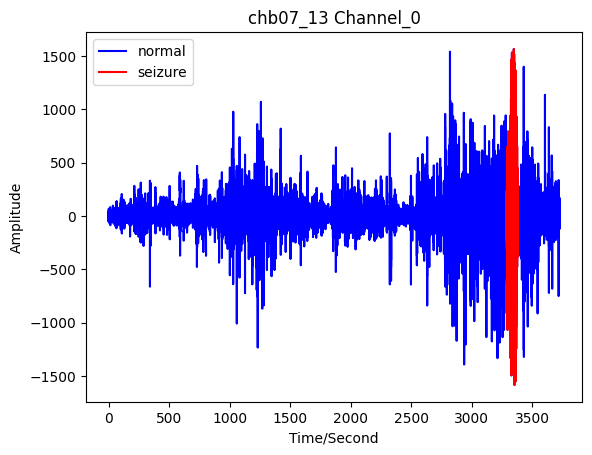

In [9]:
timeline = np.arange(0,np.size(chb07_13,axis=1)/sample_rate, 1/sample_rate) # define the time axis
start = np.where(timeline==3285)[0]  # Seizure START
end = np.where(timeline==3381)[0]    # Seizure END

plt.figure()
plt.title('chb07_13 Channel_0')
plt.plot(timeline, chb07_13[1,:],'b', label='normal')
plt.plot(timeline[int(start):int(end)],chb07_13[1,int(start):int(end)],'r', label='seizure')
plt.xlabel('Time/Second')
plt.ylabel('Amplitude')
plt.legend()

<IPython.core.display.Javascript object>


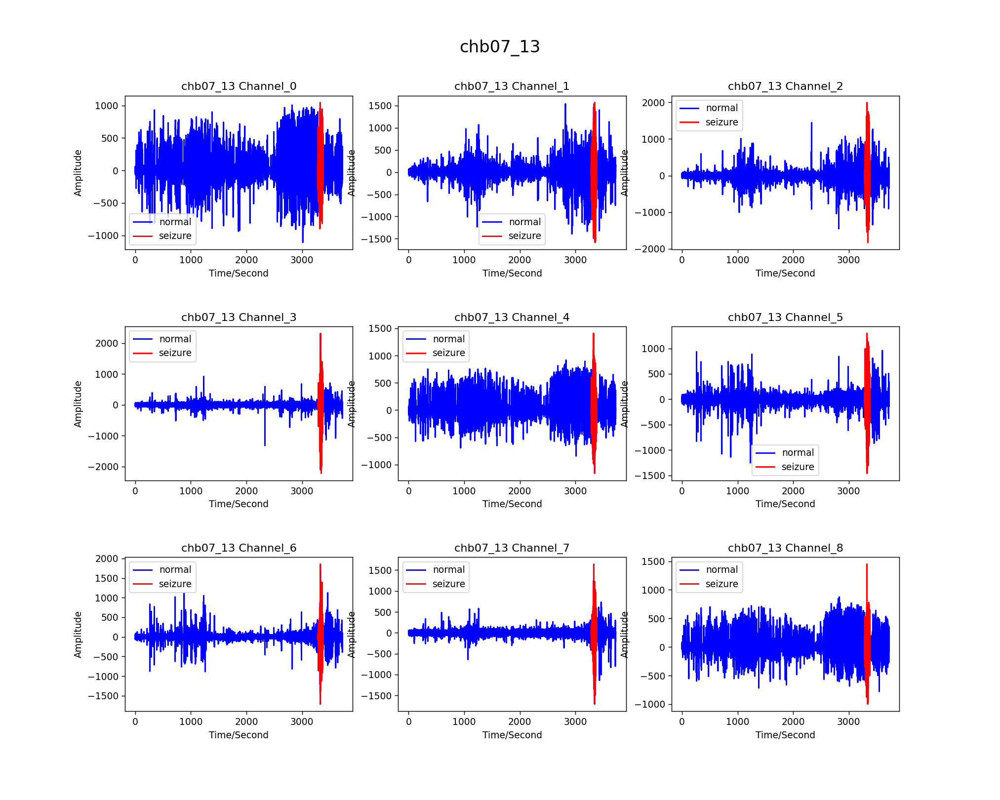

In [8]:
# Create timeline and 'start' index and 'end' index
timeline = np.arange(0,np.size(chb07_13,axis=1)/sample_rate, 1/sample_rate) # define the time axis
start = np.where(timeline==3285)[0]  # Seizure START
end = np.where(timeline==3381)[0]    # Seizure END

# Create format of subplot
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("chb07_13", fontsize=18, y=0.95)

# for i in range(22):
#     plt.figure()
#     plt.title('chb07_13 Channel_'+str(i))
#     plt.plot(timeline, chb07_13[i,:],'b', label='normal')
#     plt.plot(timeline[int(start):int(end)],chb07_13[i,int(start):int(end)],'r', label='seizure')
#     plt.xlabel('Time/Second')
#     plt.ylabel('Amplitude')
#     plt.legend()

for i in range(9):
    plt.subplot(3,3,i+1)
    plt.title('chb07_13 Channel_'+str(i))
    plt.plot(timeline, chb07_13[i,:],'b', label='normal')
    plt.plot(timeline[int(start):int(end)],chb07_13[i,int(start):int(end)],'r', label='seizure')
    plt.xlabel('Time/Second')
    plt.ylabel('Amplitude')
    plt.legend()

In [9]:
# # Plot seizure signal 
# plt.figure()
# plt.plot(timeline[int(start[0]):int(end[0])],chb07_13[0,int(start[0]):int(end[0])],'r', label='seizure')
# plt.title('Seizure signal')
# plt.ylim(-1000,1100)
# plt.xlabel('Time/Seconds')
# plt.ylabel('Intensity')

# plt.figure()
# plt.plot(timeline[int(start[0])-1024:int(end[0])-1024], chb07_13[0,int(start[0])-1024:int(end[0])-1024], 'b', label='normal')
# plt.ylim(-1000,1100)
# plt.title('Normal signal')
# plt.xlabel('Time/Seconds')
# plt.ylabel('Intensity')

In [10]:
chb07_13.shape

(23, 953856)

In [11]:
pca = PCA(n_components=23)
pca.fit(chb07_13)

PCA(n_components=23)

In [12]:
boundary = np.where(np.cumsum(pca.explained_variance_ratio_)>=0.9)
print('The number of components = ', (boundary[0][0])+1,
     'preserve 90% of the explaiend variance in the data')

The number of components =  10 preserve 90% of the explaiend variance in the data


<IPython.core.display.Javascript object>


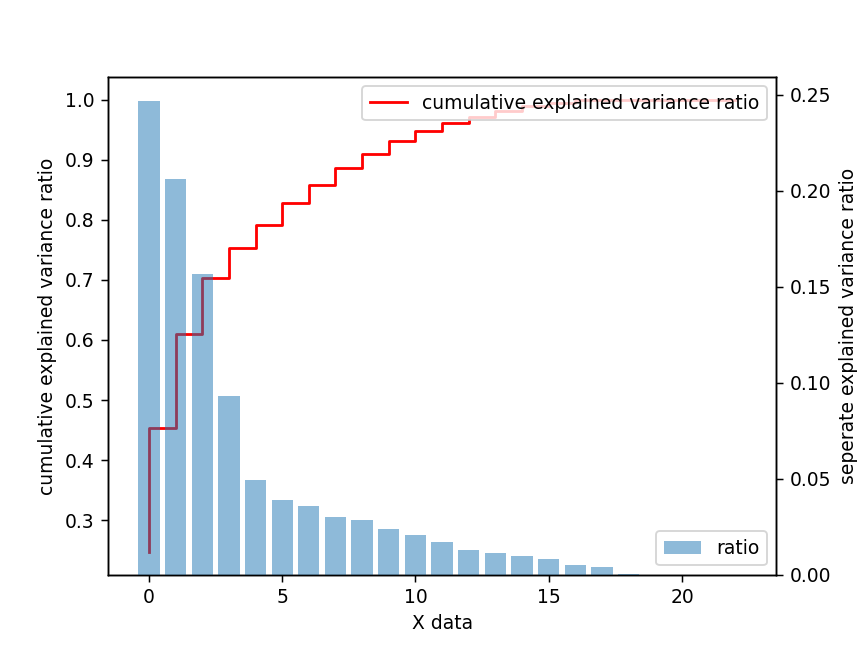

In [13]:
fig,ax1 = plt.subplots()
ax2 = ax1.twinx()

ax1.step(range(0,23), np.cumsum(pca.explained_variance_ratio_), c = 'r',
         label='cumulative explained variance ratio')
ax2.bar(range(0,23), pca.explained_variance_ratio_, alpha=0.5, label='ratio')

ax1. set_xlabel('X data')
ax1. set_ylabel('cumulative explained variance ratio')
ax2. set_ylabel('seperate explained variance ratio')
ax1. legend(loc= 'upper right')
ax2. legend(loc= 'lower right')

<IPython.core.display.Javascript object>


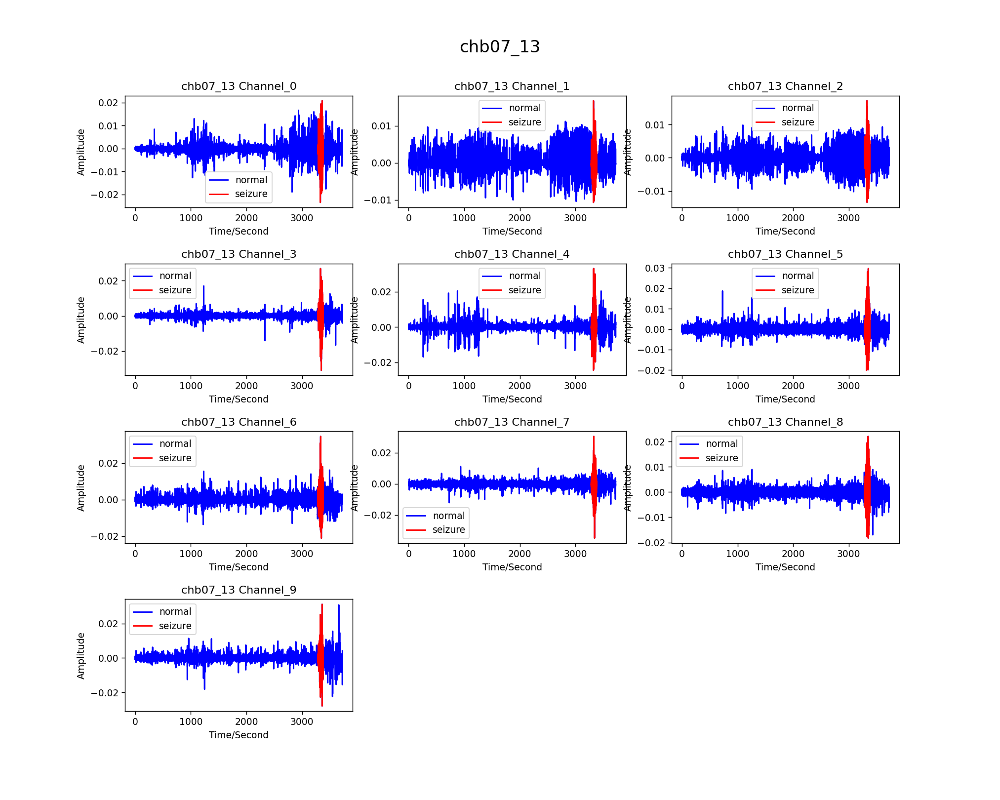

In [14]:
# Create format of subplot
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("chb07_13", fontsize=18, y=0.95)
for i in range(10):
    plt.subplot(4,3,i+1)
    plt.title('chb07_13 Channel_'+str(i))
    plt.plot(timeline, pca.components_[i,:],'b', label='normal')
    plt.plot(timeline[int(start):int(end)],pca.components_[i,int(start):int(end)],'r', label='seizure')
    plt.xlabel('Time/Second')
    plt.ylabel('Amplitude')
    plt.legend()

In [15]:
pca_signal = pca.components_[0:10,:]

In [16]:
# Mean
pca_signal_mean = np.zeros((1,10))
for i in range(10):
    pca_signal_mean[0,i] = np.mean(pca_signal[i,:])

<IPython.core.display.Javascript object>


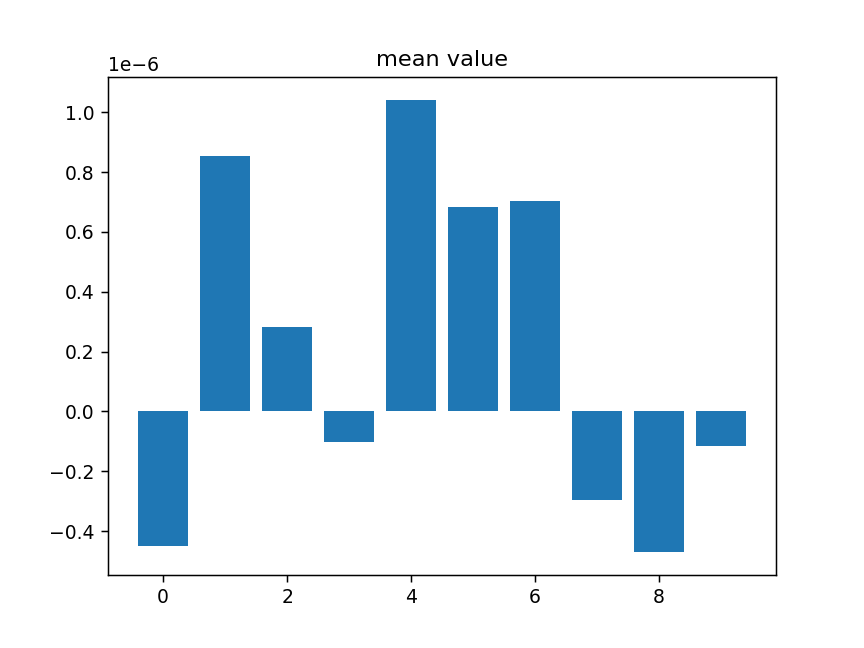

Text(0.5, 1.0, 'mean value')

In [17]:
plt.figure()
plt.bar(range(10),pca_signal_mean[0,:])
plt.title('mean value')
# COMMENT: mean value looks useless because all close to zero

<IPython.core.display.Javascript object>


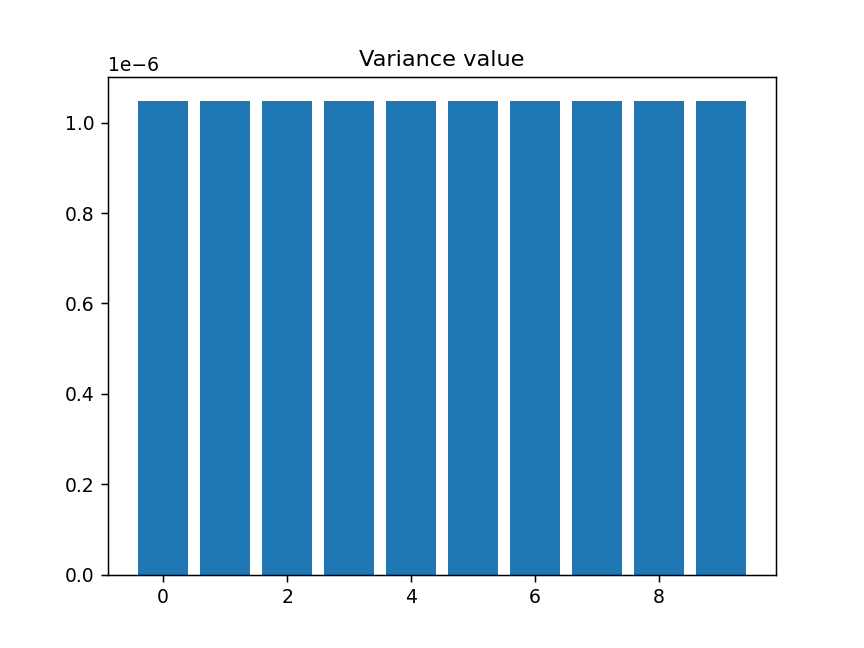

Text(0.5, 1.0, 'Variance value')

In [18]:
# Variance
pca_signal_var = np.zeros((1,10))
for i in range(10):
    pca_signal_var[0,i] = np.var(pca_signal[i,:])
    
plt.figure()
plt.bar(range(10),pca_signal_var[0,:])
plt.title('Variance value')

<IPython.core.display.Javascript object>


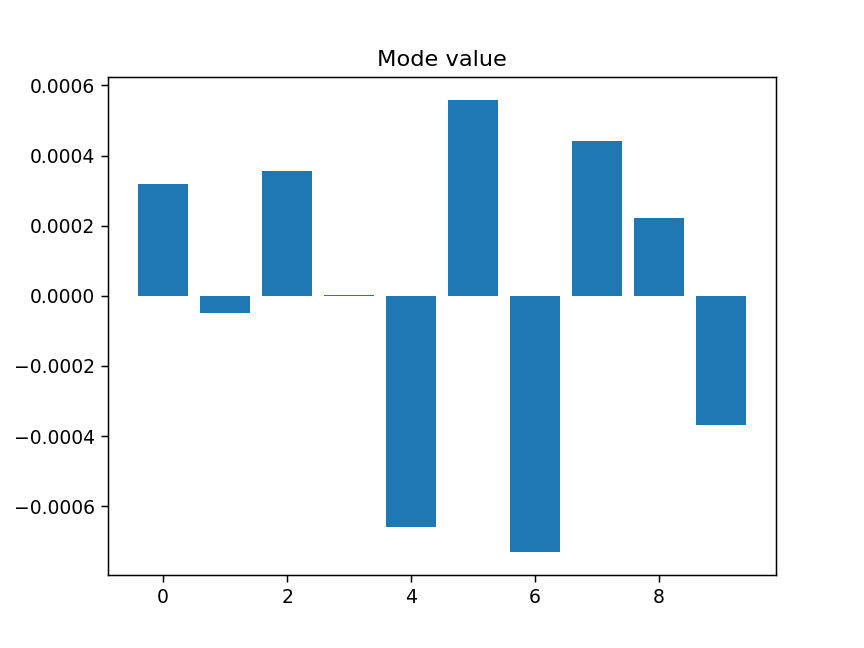

Text(0.5, 1.0, 'Mode value')

In [19]:
# Mode
pca_signal_mode = np.zeros((1,10))
for i in range(10):
    pca_signal_mode[0,i] = statistics.mode(pca_signal[i,:])
    
plt.figure()
plt.bar(range(10), pca_signal_mode[0,:])
plt.title('Mode value')

<IPython.core.display.Javascript object>


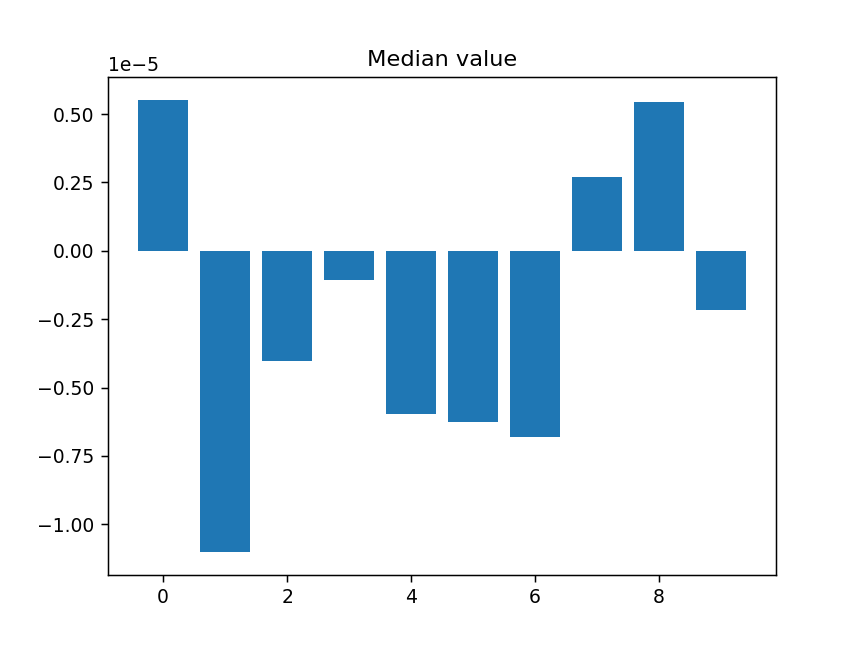

Text(0.5, 1.0, 'Median value')

In [20]:
# Median
pca_signal_median = np.zeros((1,10))
for i in range(10):
    pca_signal_median[0,i] = np.median(pca_signal[i,:])
    
plt.figure()
plt.bar(range(10), pca_signal_median[0,:])
plt.title('Median value')

<IPython.core.display.Javascript object>


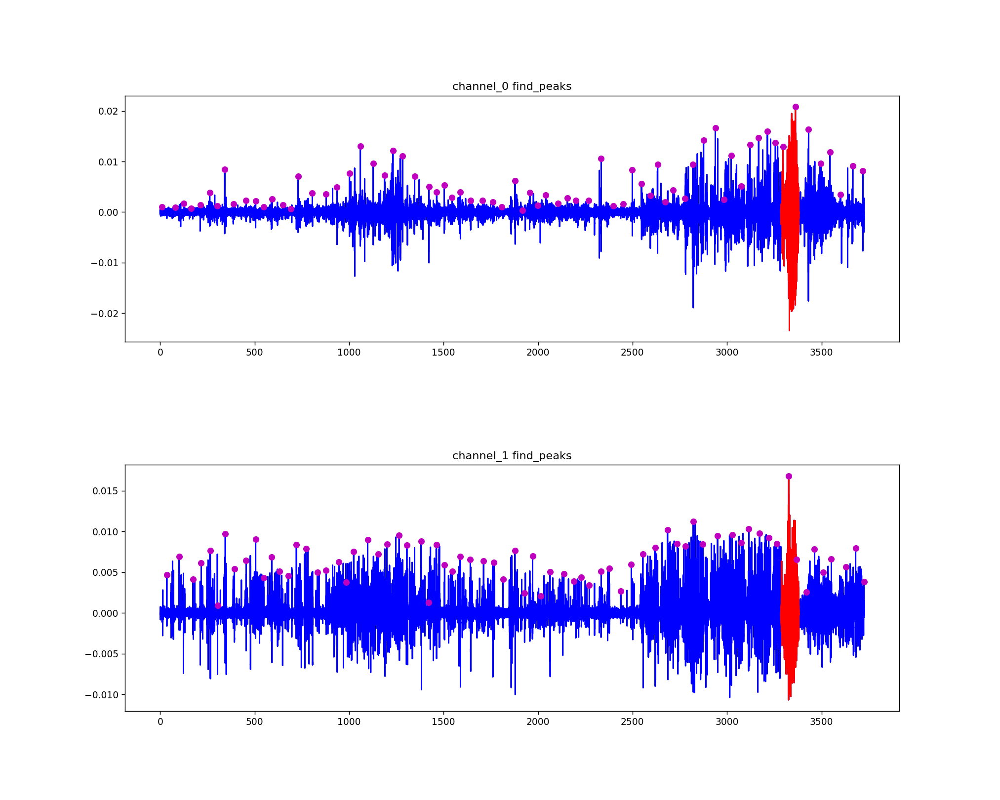

In [21]:
# Peak
import scipy.signal

plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)

peaks = scipy.signal.find_peaks(pca_signal[0,:], distance=10000)
plt.subplot(2,1,1)
plt.plot(timeline, pca.components_[0,:],'b', label='normal')
plt.plot(timeline[int(start):int(end)],pca.components_[0,int(start):int(end)],'r', label='seizure')
plt.plot(timeline[peaks[0]], pca_signal[0,:][peaks[0]], "o",c='m')
plt.title("channel_0 find_peaks")
plt.show()

plt.subplot(2,1,2)
peaks = scipy.signal.find_peaks(pca_signal[1,:], distance=10000)
plt.plot(timeline, pca.components_[1,:],'b', label='normal')
plt.plot(timeline[int(start):int(end)],pca.components_[1,int(start):int(end)],'r', label='seizure')
plt.plot(timeline[peaks[0]], pca_signal[1,:][peaks[0]], "o",c='m')
plt.title("channel_1 find_peaks")
plt.show()

In [22]:
np.sum(pca_signal[1,:]*pca_signal[1,:])

1.0000000000001092

In [23]:
chb07_13[0,:]@chb07_13[0,:]

8844375572.662188

<IPython.core.display.Javascript object>


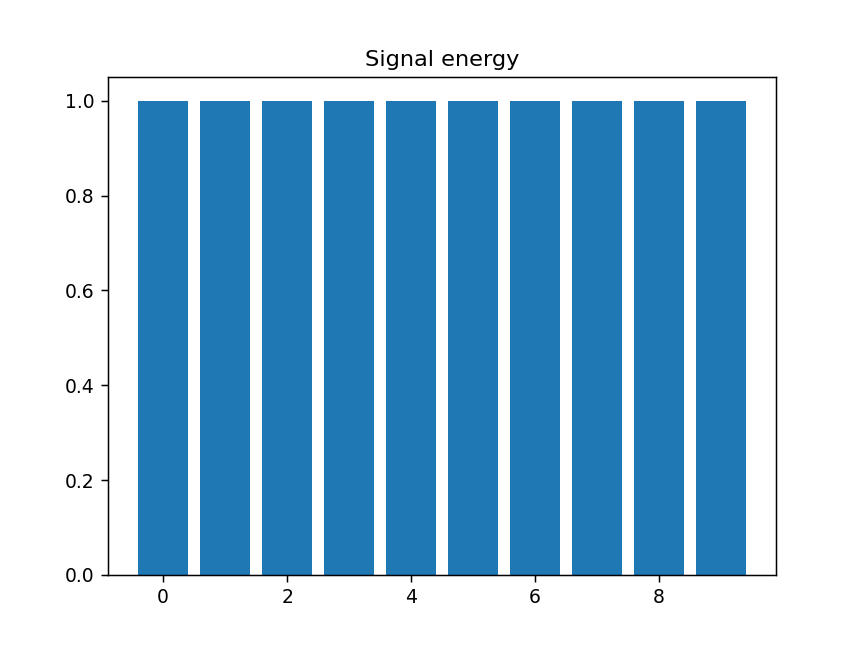

Text(0.5, 1.0, 'Signal energy')

In [24]:
# Energy
pca_signal_energy = np.zeros((1,10))
for i in range(10):
    pca_signal_energy[0,i] = np.sum(pca_signal[i,:]@pca_signal[i,:])
    
plt.figure()
plt.bar(range(10), pca_signal_energy[0,:])
plt.title('Signal energy')
# COMMENT: Signal energy close to one, which may be caused by PCA operation. 

<IPython.core.display.Javascript object>


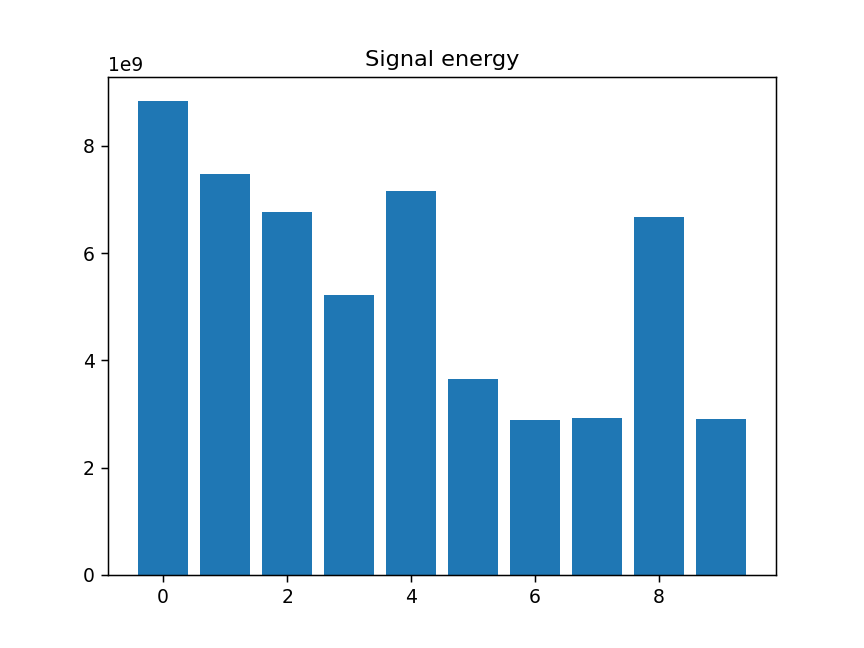

Text(0.5, 1.0, 'Signal energy')

In [37]:
# Energy non-pca signal
signal_energy = np.zeros((1,10))
for i in range(10):
    signal_energy[0,i] = np.sum(chb07_13[i,:]@chb07_13[i,:])
    
plt.figure()
plt.bar(range(10), signal_energy[0,:])
plt.title('Signal energy')
# COMMENT: Signal energy close to one, which may be caused by PCA operation. 

________

# RAW --> segment --> approximate entropy

In [2]:
import numpy as np
import statistics
import pyedflib
# import mne

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt

from IPython.display import display, Markdown  #display(Markdown("# Hello World!"))


### Read dataset

In [3]:
display(Markdown('[All signals were sampled at 256 samples per second with 16-bit resolution]\
(https://www.researchgate.net/figure/23-scalp-EEG-channels-in-the-CHB-MIT-recordings_tbl1_356885415)'))

# File Name: chb07_13.edf
# File Start Time: 11:46:29
# File End Time: 12:48:35
# Number of Seizures in File: 1
# Seizure 1 Start Time: 3285 seconds
# Seizure 1 End Time: 3381 seconds

sample_rate = 256

[All signals were sampled at 256 samples per second with 16-bit resolution](https://www.researchgate.net/figure/23-scalp-EEG-channels-in-the-CHB-MIT-recordings_tbl1_356885415)

In [4]:
def readedf(path):
    f = pyedflib.EdfReader(path)
    n = f.signals_in_file
    signal_labels = f.getSignalLabels()
    sigbufs = np.zeros((n, f.getNSamples()[0]))
    for i in np.arange(n):
        sigbufs[i,:] = f.readSignal(i)
    return sigbufs

In [5]:
# f = pyedflib.EdfReader('./chb07_12.seizures.edf')
# n = f.signals_in_file

# signal_labels = f.getSignalLabels()
# sigbufs = np.zeros((n, f.getNSamples()[0]))

# fig = plt.figure()
# ax = plt.axes()
# for i in np.arange(n):
#     sigbufs[i,:] = f.readSignal(i)
#     ax.plot(f.readSignal(i))
#     plt.show()

In [6]:
path = './chb07_13.edf'
chb07_13 = readedf(path)
chb07_13.shape

(23, 953856)

In [7]:
%matplotlib notebook

<IPython.core.display.Javascript object>


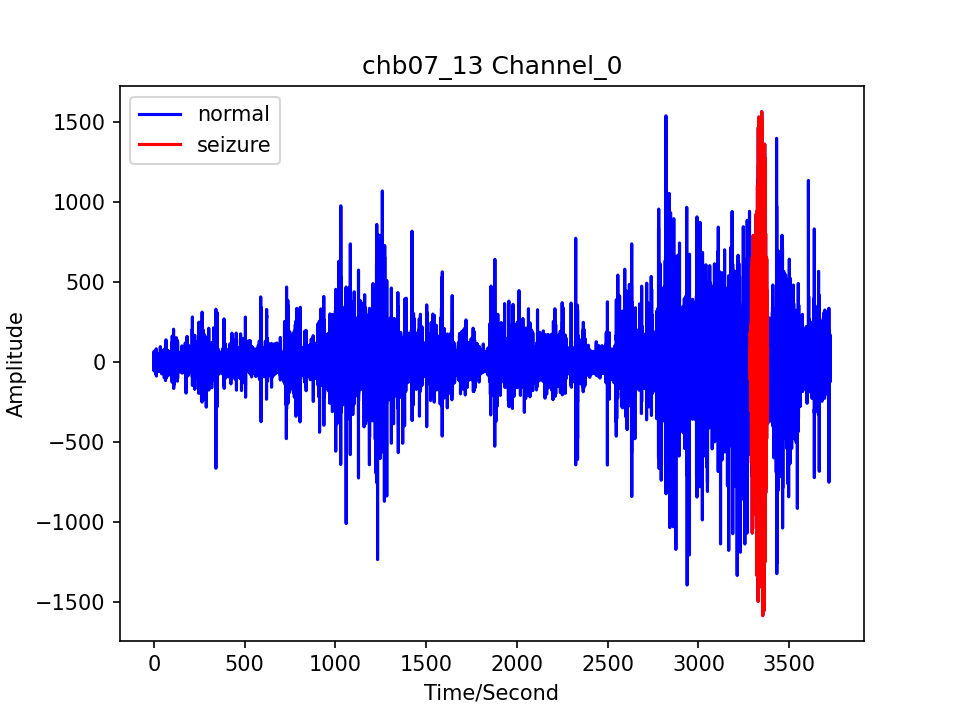

In [8]:
timeline = np.arange(0,np.size(chb07_13,axis=1)/sample_rate, 1/sample_rate) # define the time axis
seizure_start = np.where(timeline==3285)[0]  # Seizure START
seizure_end = np.where(timeline==3381)[0]    # Seizure END

plt.figure()
plt.title('chb07_13 Channel_0')
plt.plot(timeline, chb07_13[1,:],'b', label='normal')
plt.plot(timeline[int(seizure_start):int(seizure_end)],chb07_13[1,int(seizure_start):int(seizure_end)],'r', label='seizure')
plt.xlabel('Time/Second')
plt.ylabel('Amplitude')
plt.legend()

In [9]:
3441 - 3225 -120

96

<IPython.core.display.Javascript object>


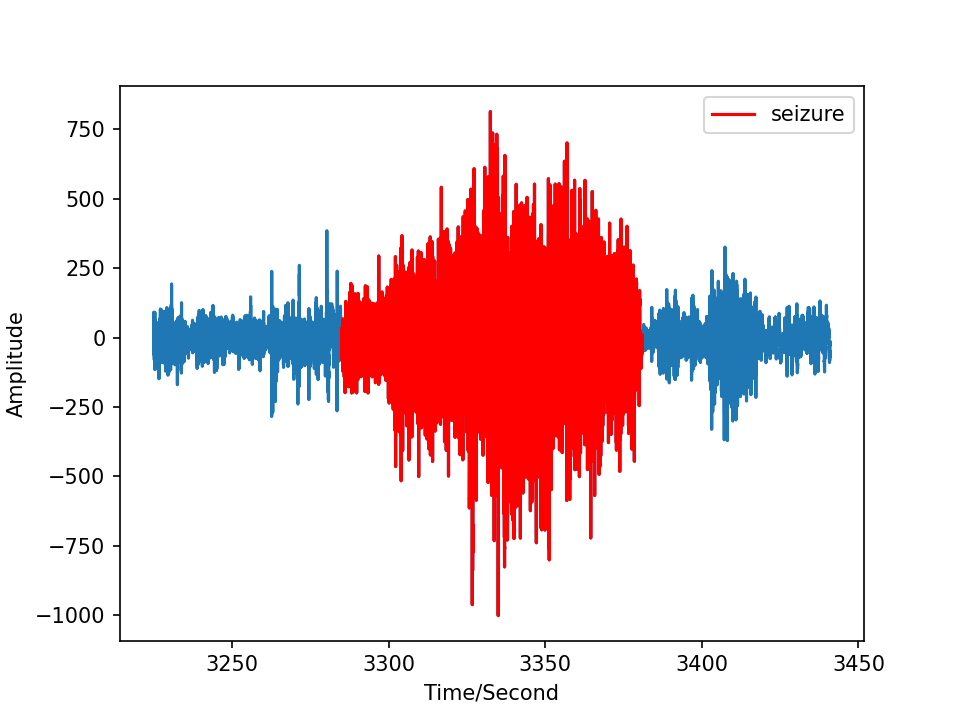

Signal contain 216 seconds, pre-ictal:60 seconds, ictal:96 seconds, inter-ictal:60 seconds


In [10]:
# segment signal
seg_start = np.where(timeline==3225)[0]     # prior 60min
seg_end = np.where(timeline==3441)[0]           # expend 60min
seg_signal = chb07_13[:,int(seg_start):int(seg_end)]   # extract segmented signal
seg_timeline = np.arange(3225,3441, 1/sample_rate)

plt.figure()
plt.plot(seg_timeline, seg_signal[22,:])
plt.plot(timeline[int(seizure_start):int(seizure_end)],chb07_13[22,int(seizure_start):int(seizure_end)],'r', label='seizure')
plt.xlabel('Time/Second')
plt.ylabel('Amplitude')
plt.legend()
print('Signal contain 216 seconds, pre-ictal:60 seconds, ictal:96 seconds, inter-ictal:60 seconds')

<IPython.core.display.Javascript object>


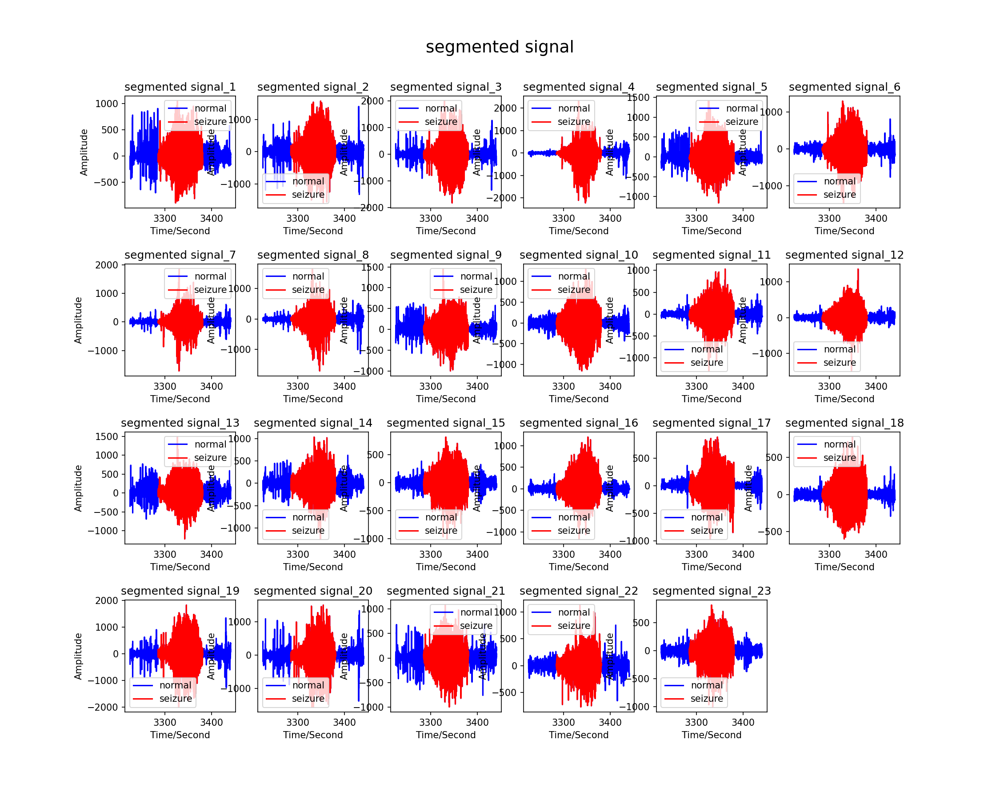

In [11]:
# Create format of subplot
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("segmented signal", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('segmented signal_'+str(i+1))
    plt.plot(seg_timeline, seg_signal[i,:],'b', label='normal')
    plt.plot(timeline[int(seizure_start):int(seizure_end)],chb07_13[i,int(seizure_start):int(seizure_end)],'r', label='seizure')
    plt.xlabel('Time/Second')
    plt.ylabel('Amplitude')
    plt.legend()

In [15]:
# Approximate entropy
import numpy as np


def ApEn(U, m, r) -> float:
    """Approximate_entropy."""

    def _maxdist(x_i, x_j):
        return max([abs(ua - va) for ua, va in zip(x_i, x_j)])

    def _phi(m):
        x = [[U[j] for j in range(i, i + m - 1 + 1)] for i in range(N - m + 1)]
        C = [
            len([1 for x_j in x if _maxdist(x_i, x_j) <= r]) / (N - m + 1.0)
            for x_i in x
        ]
        return (N - m + 1.0) ** (-1) * sum(np.log(C))

    N = len(U)

    return abs(_phi(m + 1) - _phi(m))

In [16]:
def sliding_window_no_overlay(sequence, window_size):
    result = []
    for i in range(0, len(sequence), window_size):
        window = sequence[i:i+window_size]
        result.append(window)
    return result

In [17]:
import math
window_size = 2560
segment_signal_mean = np.zeros((np.size(seg_signal,axis=0),math.ceil(np.size(seg_signal,axis=1)/window_size))) # init mean value
segment_signal_var = np.zeros((np.size(seg_signal,axis=0),math.ceil(np.size(seg_signal,axis=1)/window_size)))  # init variance value
for i in range(np.size(seg_signal,axis=0)):
    window_signal = sliding_window_no_overlay(seg_signal[i,:], window_size=window_size)  # sample rate=256, so its period is 10 second
    for j in range(len(window_signal)):
        segment_signal_mean[i,j] = np.mean(window_signal[j])
        segment_signal_var[i,j] = np.var(window_signal[j])

<IPython.core.display.Javascript object>


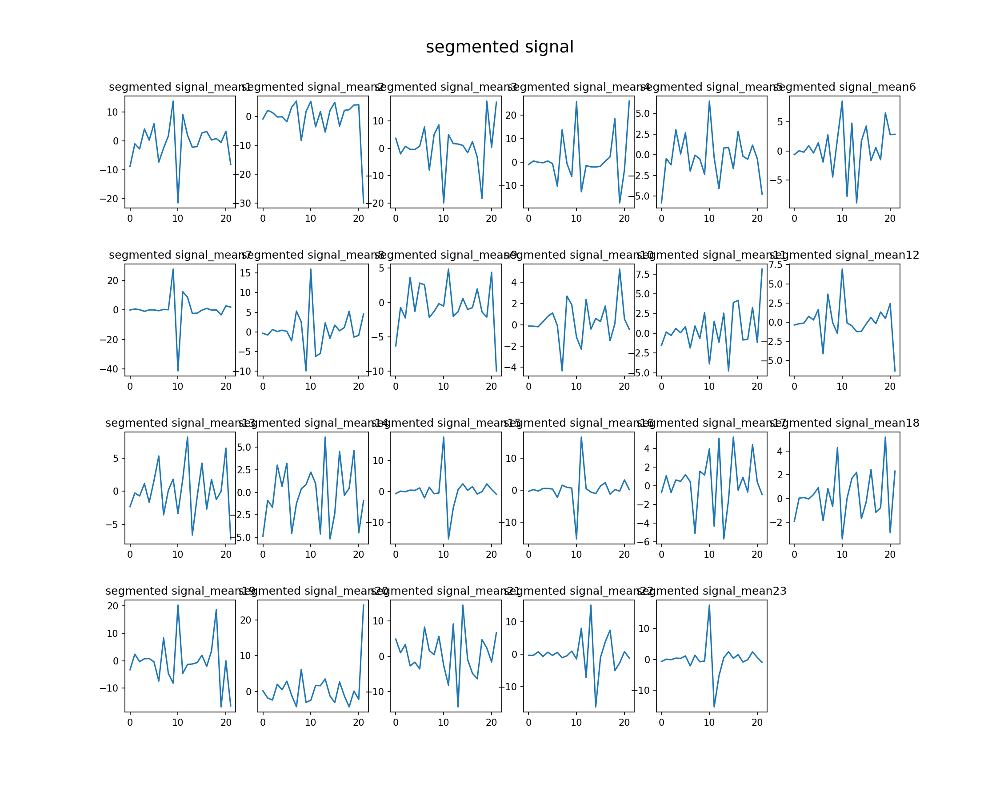

In [18]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("segmented signal", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('segmented signal_mean'+str(i+1))
    plt.plot(segment_signal_mean[i,:])

<IPython.core.display.Javascript object>


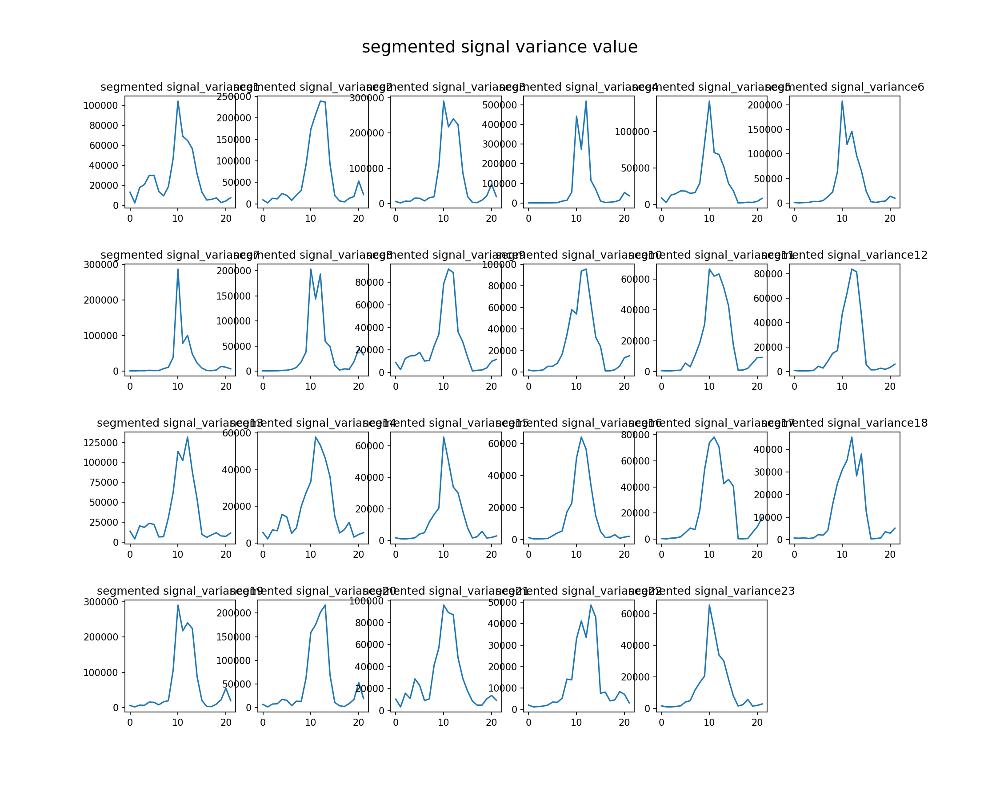

In [22]:
plt.figure(figsize=(15, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("segmented signal variance value", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('segmented signal_variance'+str(i+1))
    plt.plot(segment_signal_var[i,:])

In [35]:
# One channel of segmented signal()
# import time
# start = time.time()
# ap_en = ApEn(seg_signal[0,:],m=2,r=0.2)
# end = time.time()
# print('Elapsed time=', end-start)
############################################################Running about 30 min could not get result.

In [36]:
55296 - 21*2560

1536

<IPython.core.display.Javascript object>


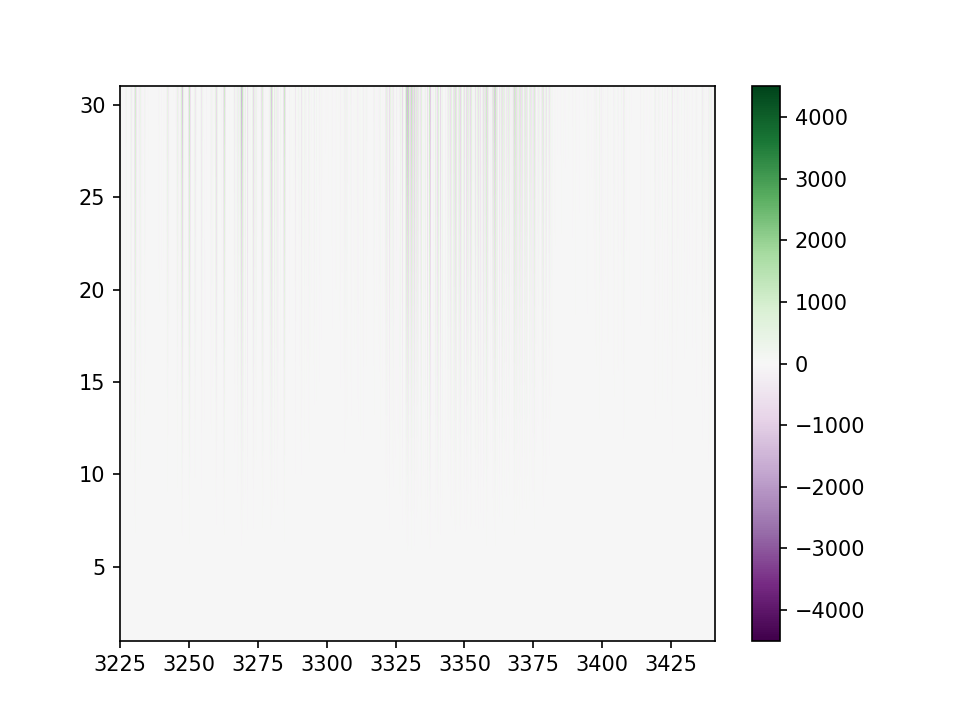

In [25]:
from scipy import signal
widths = np.arange(1,31)
cwtmatr = signal.cwt(seg_signal[0,:], signal.ricker, widths)
cwtmatr_yflip = np.flipud(cwtmatr)
plt.figure()
plt.imshow(cwtmatr_yflip, extent=[3225, 3441, 1, 31], cmap='PRGn', aspect='auto',
           vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())
cbar = plt.colorbar()
plt.show()

# Spectrum energy
<br>
Our results showed that using 3 bands of 0-7Hz, 8-14Hz, and 15-30Hz yields the best overall accuracy.(source: Energy-Efficient Spiking-CNN-Based Cross-Patient Seizure Detection, Abdul Muneeb, Hossein Kassiri)<br>
The most commonly studied waveforms include delta (0.5 to 4Hz); theta (4 to 7Hz); alpha (8 to 12Hz); sigma (12 to 16Hz) and beta (13 to 30Hz).(source: https://www.ncbi.nlm.nih.gov/books/NBK539805/)

In [26]:
from scipy.fftpack import fft, ifft

In [27]:
window_signal[0].shape

(2560,)

The sample rate is 256


<IPython.core.display.Javascript object>


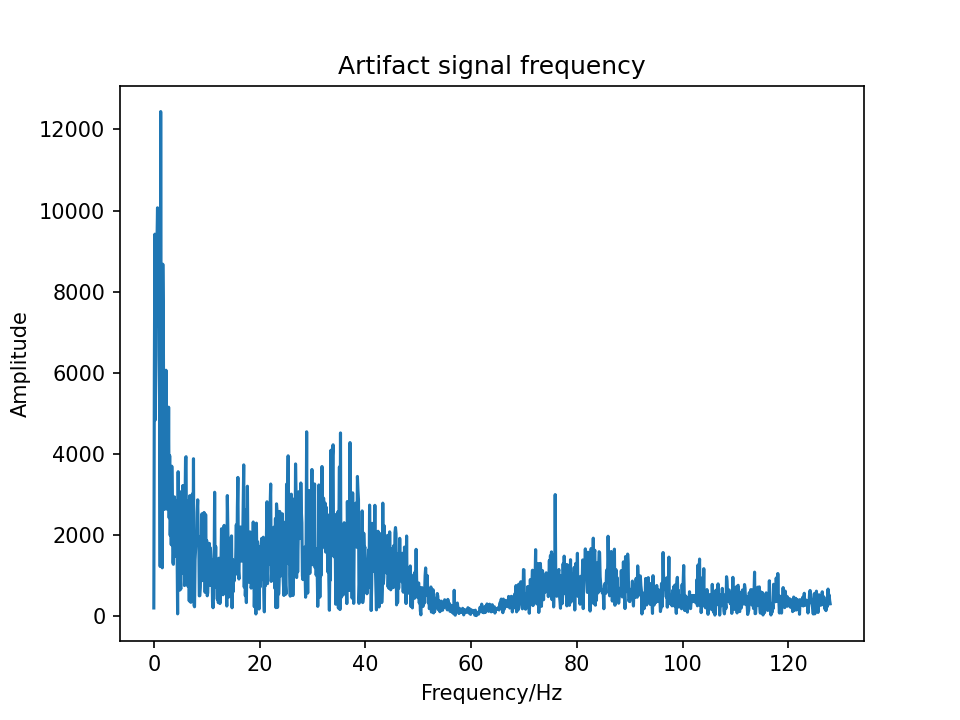

Text(0.5, 1.0, 'Artifact signal frequency')

In [28]:
sample_rate = 256 # Sample rate
print('The sample rate is', sample_rate)
window_signal_temp = window_signal[2]
freqaxis = (np.arange(len(window_signal_temp)))/(len(window_signal_temp)/sample_rate)

plt.figure()
plt.plot(freqaxis[:int(len(freqaxis)/2)], np.abs(fft(window_signal_temp))[:int(len(freqaxis)/2)])
plt.xlabel('Frequency/Hz')
plt.ylabel('Amplitude')
plt.title('Artifact signal frequency')

In [29]:
# sample_rate = 256 # Sample rate
# print('The sample rate is', sample_rate)
# window_signal_temp = window_signal[0]
# freqaxis = (np.arange(len(window_signal_temp)))/(len(window_signal_temp)/sample_rate)

# plt.figure()
# plt.plot(freqaxis[0:300], np.abs(fft(window_signal_temp))[0:300])
# plt.ylim(0,14000)
# plt.xlabel('Frequency/Hz')
# plt.ylabel('Amplitude')
# plt.title('Artifact signal frequency')

Simpson’s rule approximates the function between three adjacent points as a parabola.(source: https://docs.scipy.org/doc/scipy/tutorial/integrate.html)

In [30]:
from scipy import integrate
integrate.simpson(np.abs(fft(window_signal_temp))[0:70], freqaxis[0:70])
integrate.simpson(np.abs(fft(window_signal_temp))[80:140], freqaxis[80:140])
integrate.simpson(np.abs(fft(window_signal_temp))[150:300], freqaxis[150:300])

24522.556490982035

In [31]:
freqaxis.shape, fft(window_signal[0]).shape

((2560,), (2560,))

In [32]:
window_size = 256 * 5
segment_signal_a = np.zeros((np.size(seg_signal,axis=0),math.ceil(np.size(seg_signal,axis=1)/window_size))) # init 0-7 Hz
segment_signal_b = np.zeros((np.size(seg_signal,axis=0),math.ceil(np.size(seg_signal,axis=1)/window_size)))  # init 8-14 Hz
segment_signal_c = np.zeros((np.size(seg_signal,axis=0),math.ceil(np.size(seg_signal,axis=1)/window_size)))  # init 15-30 Hz
for i in range(np.size(seg_signal,axis=0)):
    window_signal = sliding_window_no_overlay(seg_signal[i,:], window_size = window_size)  # sample rate=256, so its period is 10 second
    for j in range(len(window_signal)-1):
        segment_signal_a[i,j] = integrate.simpson(np.abs(fft(window_signal[j]))[0:70], freqaxis[0:70])
        segment_signal_b[i,j] = integrate.simpson(np.abs(fft(window_signal[j]))[80:140], freqaxis[80:140])
        segment_signal_c[i,j] = integrate.simpson(np.abs(fft(window_signal[j]))[150:300], freqaxis[150:300])

<IPython.core.display.Javascript object>


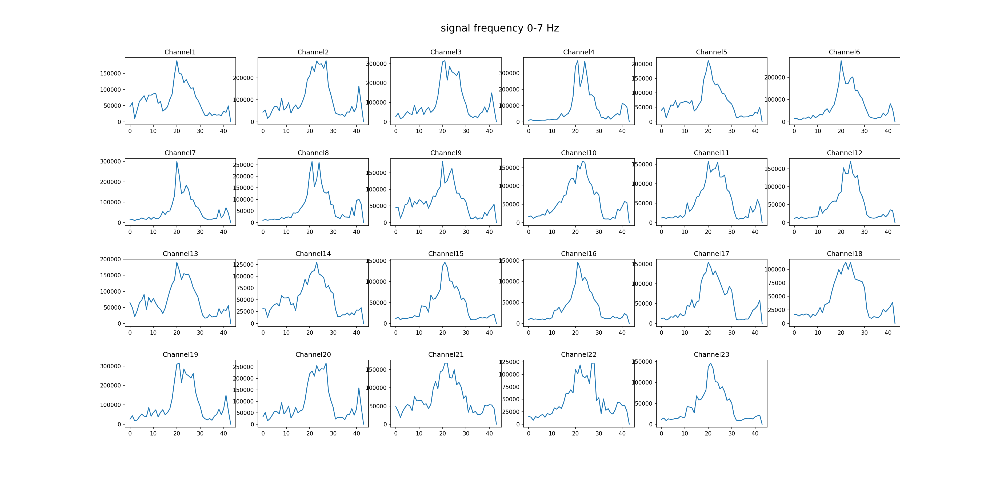

In [33]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 0-7 Hz", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.plot(segment_signal_a[i,:])

<IPython.core.display.Javascript object>


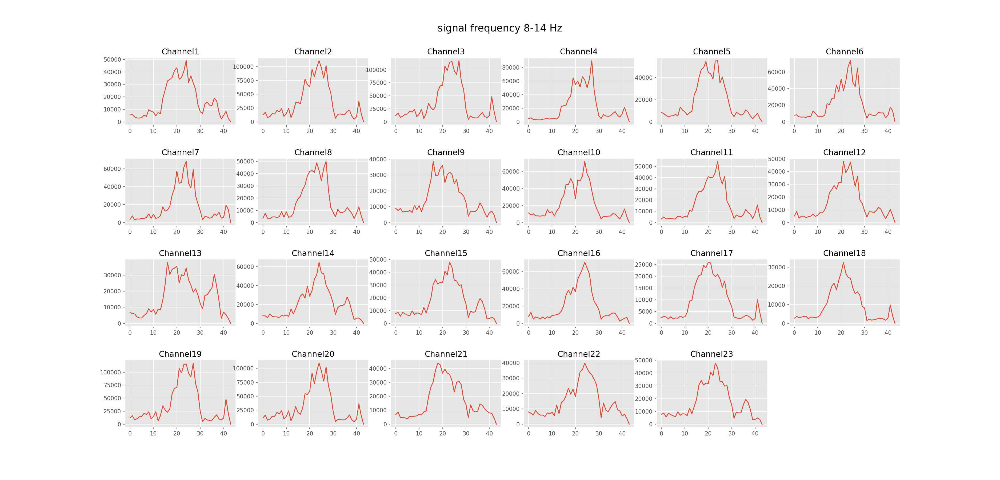

In [37]:
plt.figure(figsize=(25, 12))
plt.style.use('ggplot')
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 8-14 Hz", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.plot(segment_signal_b[i,:])

<IPython.core.display.Javascript object>


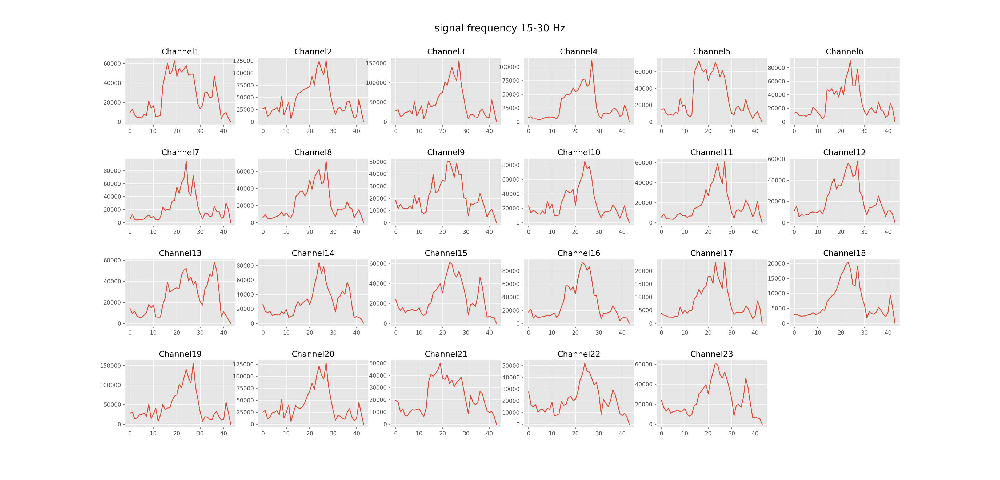

In [38]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 15-30 Hz", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.plot(segment_signal_c[i,:])

In [39]:
def cus_gradient(array):
    gradient_array = np.zeros(len(array))
    for i in range(1,len(array)):
        gradient_array[i] = array[i] - array[i-1]
    return gradient_array

<IPython.core.display.Javascript object>


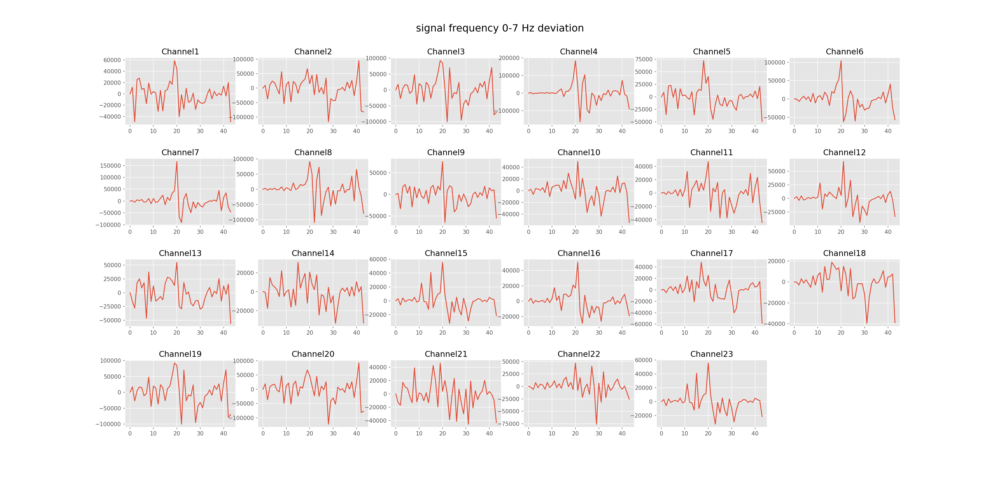

In [40]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 0-7 Hz deviation", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.plot(cus_gradient(segment_signal_a[i,:]))

<IPython.core.display.Javascript object>


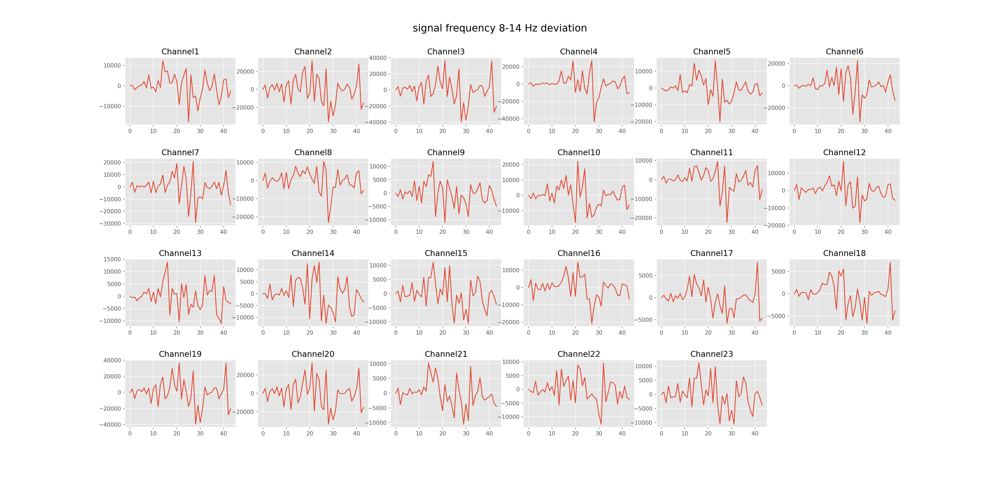

In [41]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 8-14 Hz deviation", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.plot(cus_gradient(segment_signal_b[i,:]))

<IPython.core.display.Javascript object>


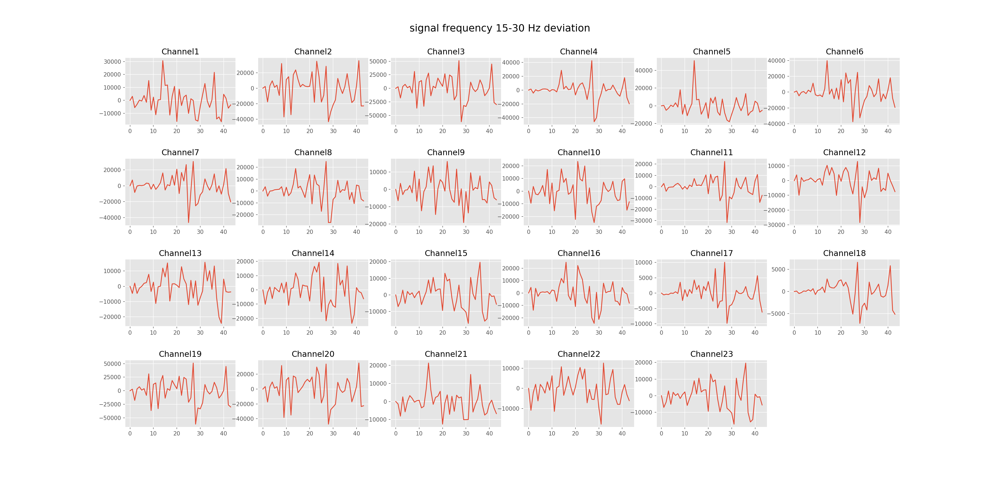

In [49]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 15-30 Hz deviation", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.scatter(range(len(cus_gradient(segment_signal_c[i,:]))),cus_gradient(segment_signal_c[i,:]))

<IPython.core.display.Javascript object>


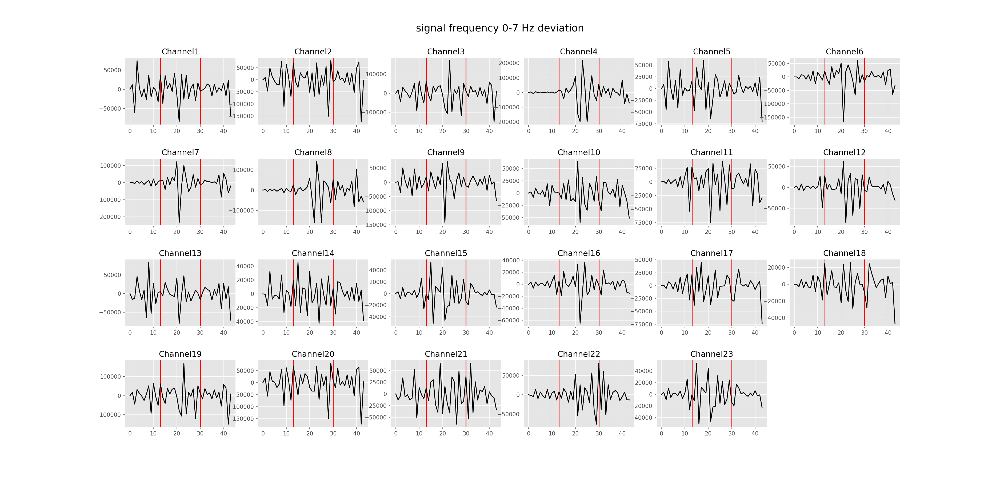

In [53]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 0-7 Hz deviation", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.axvline(x = 13, color = 'r')
    plt.axvline(x = 30, color = 'r')
    plt.plot(cus_gradient(cus_gradient(segment_signal_a[i,:])), color='k')

<IPython.core.display.Javascript object>


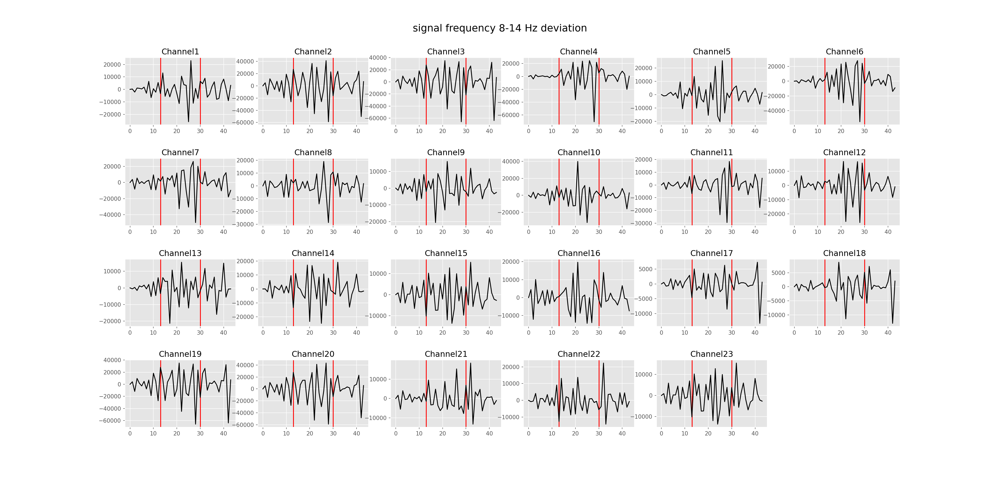

In [54]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 8-14 Hz deviation", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.axvline(x = 13, color = 'r')
    plt.axvline(x = 30, color = 'r')
    plt.plot(cus_gradient(cus_gradient(segment_signal_b[i,:])), color='k')

<IPython.core.display.Javascript object>


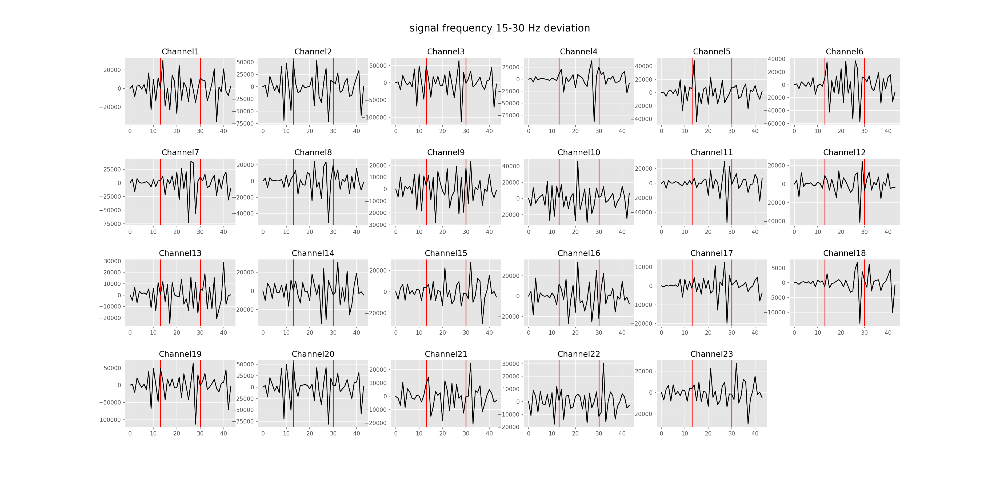

In [56]:
plt.figure(figsize=(25, 12))
plt.subplots_adjust(hspace=0.5)
plt.suptitle("signal frequency 15-30 Hz deviation", fontsize=18, y=0.95)
for i in range(23):
    plt.subplot(4,6,i+1)
    plt.title('Channel'+str(i+1))
    plt.axvline(x = 13, color = 'r')
    plt.axvline(x = 30, color = 'r')
    plt.plot(cus_gradient(cus_gradient(segment_signal_c[i,:])), color='k')